## Advanced Lane Finding
[![Udacity - Self-Driving Car NanoDegree](https://s3.amazonaws.com/udacity-sdc/github/shield-carnd.svg)](http://www.udacity.com/drive)


In this project, your goal is to write a software pipeline to identify the lane boundaries in a video, but the main output or product we want you to create is a detailed writeup of the project.  Check out the [writeup template](https://github.com/udacity/CarND-Advanced-Lane-Lines/blob/master/writeup_template.md) for this project and use it as a starting point for creating your own writeup.  

The Project
---

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

Step 1: Perform camera calibraion

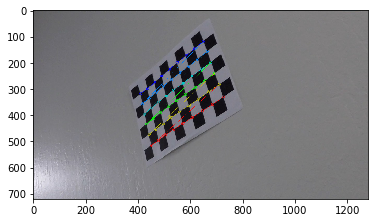

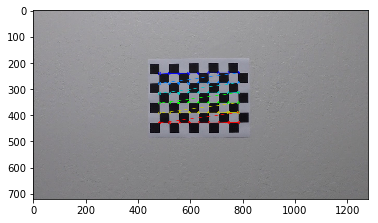

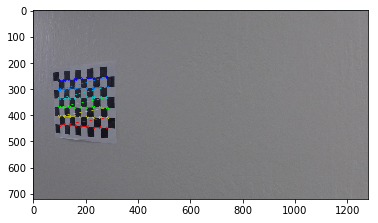

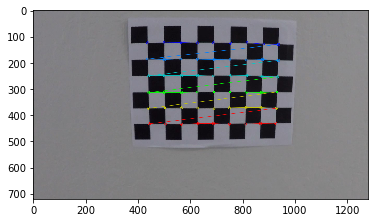

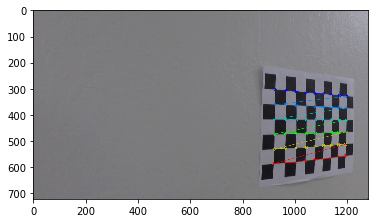

...

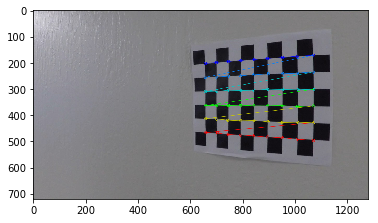

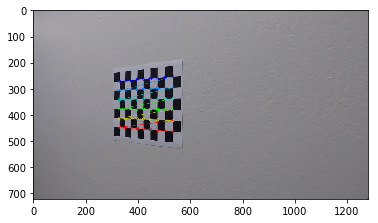

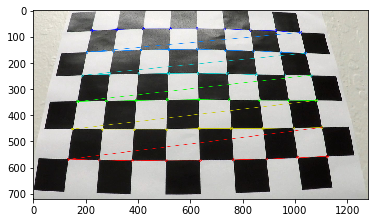

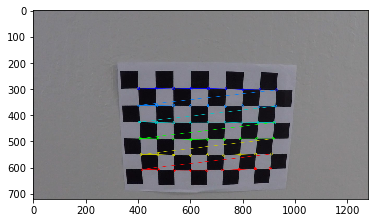

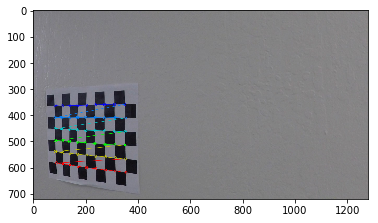

# of images used for calibration :  17
Calibration done!


In [61]:
import os
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

objpoints =[]
imgpoints = []
objp = np.zeros((6*9,3),np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

files = glob.glob( "./camera_cal/*.jpg");
for fn in files:
    img = mpimg.imread(fn)
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        plt.imshow(img)
        plt.show()
        #print("show img")

print("# of images used for calibration : ", len(objpoints))
        
# perfrom calibration
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

print("Calibration done!")



Step 2: Apply a distortion correction to raw images

Undistortion exmaple


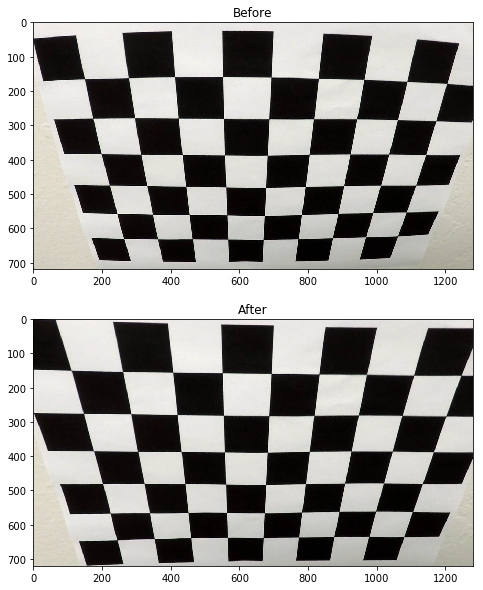

In [2]:
print("Undistortion exmaple")
count = 0
for fn in files:
    count += 1
    img = mpimg.imread(fn)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    if(count ==9):
        fig = plt.figure(figsize=(20,10))
        a=fig.add_subplot(2,1,1)
        imgplot = plt.imshow(img)
        a.set_title('Before')
        
        a=fig.add_subplot(2,1,2)
        imgplot = plt.imshow(dst)
        a.set_title('After')        
        plt.show()
    

(54, 1, 2)


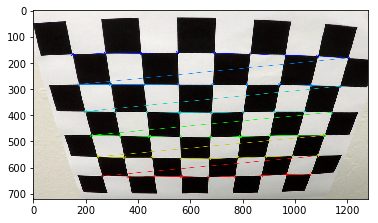

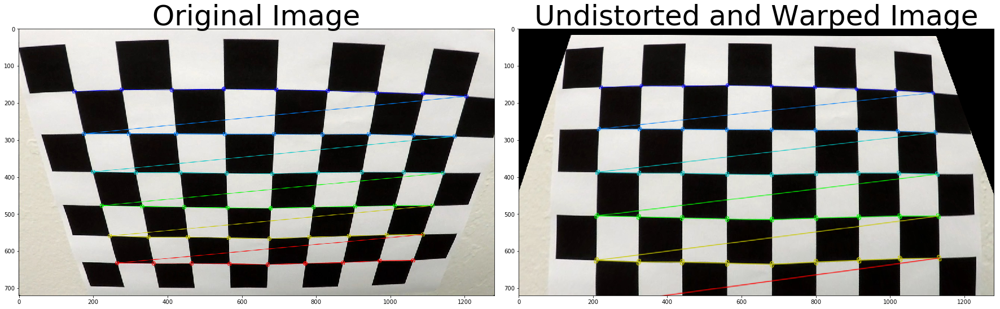

In [72]:
# compute perspective transformation matrix
# Read in an image
img = mpimg.imread(files[8])
nx = 9 # the number of inside corners in x
ny = 6 # the number of inside corners in y

# MODIFY THIS FUNCTION TO GENERATE OUTPUT 
# THAT LOOKS LIKE THE IMAGE ABOVE
def corners_unwarp(img, nx, ny, mtx, dist):
    # Pass in your image into this function
    # Write code to do the following steps
    # 1) Undistort using mtx and dist
    # 2) Convert to grayscale
    # 3) Find the chessboard corners
    # 4) If corners found: 
            # a) draw corners
            # b) define 4 source points src = np.float32([[,],[,],[,],[,]])
                 #Note: you could pick any four of the detected corners 
                 # as long as those four corners define a rectangle
                 #One especially smart way to do this would be to use four well-chosen
                 # corners that were automatically detected during the undistortion steps
                 #We recommend using the automatic detection of corners in your code
            # c) define 4 destination points dst = np.float32([[,],[,],[,],[,]])
            # d) use cv2.getPerspectiveTransform() to get M, the transform matrix
            # e) use cv2.warpPerspective() to warp your image to a top-down view
    #delete the next two lines
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    if ret == True:
        print(corners.shape)
        img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        plt.imshow(img)
        plt.show()
       
        src = np.float32( 
            [corners[20,0,0:2],
             corners[23,0,0:2],
             corners[38,0,0:2],
             corners[41,0,0:2]] )
        dst = np.float32( 
        [[440,390,],    
        [800,390],
        [440,630],
        [800,630]] )
        M = cv2.getPerspectiveTransform(src, dst)
        img_size = (img.shape[1],img.shape[0])
        warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped, M

top_down, perspective_M = corners_unwarp(img, nx, ny, mtx, dist)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(top_down)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)



Step 3: Use color transforms, gradients, etc., to create a thresholded binary image.

In [73]:
# Load the test image and perform undistortion
files = glob.glob( "./test_images/*.jpg");
imgs_test = []
for fn in files:
    img = mpimg.imread(fn)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    imgs_test.append(dst)

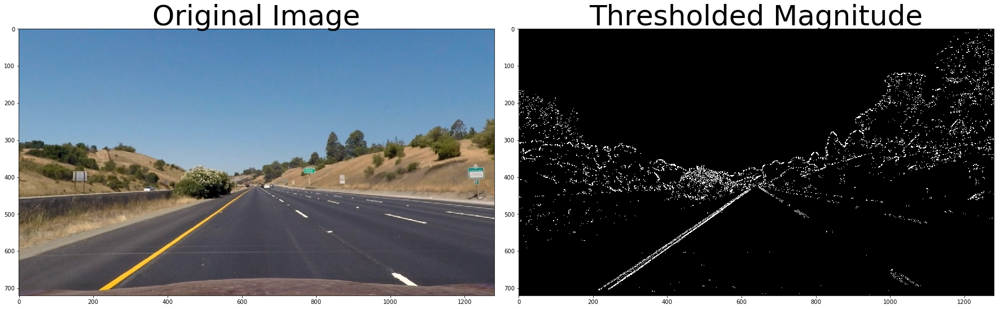

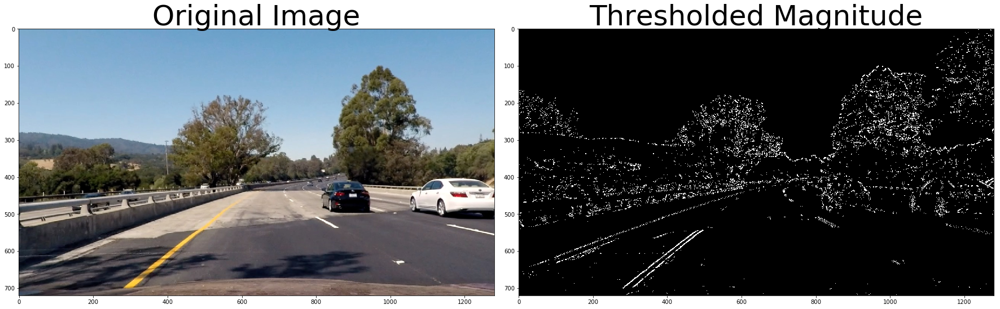

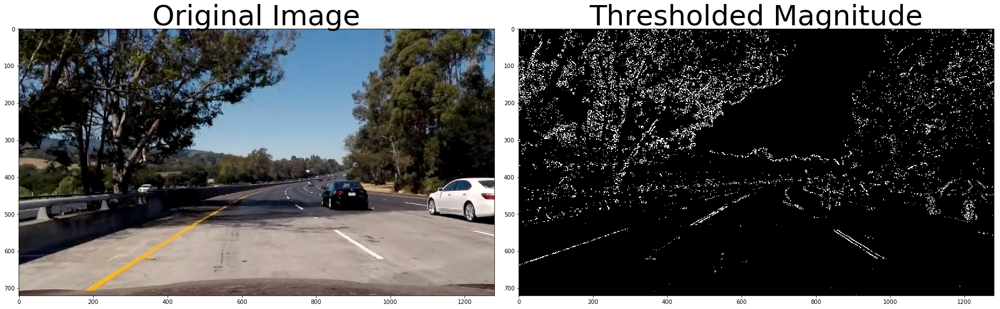

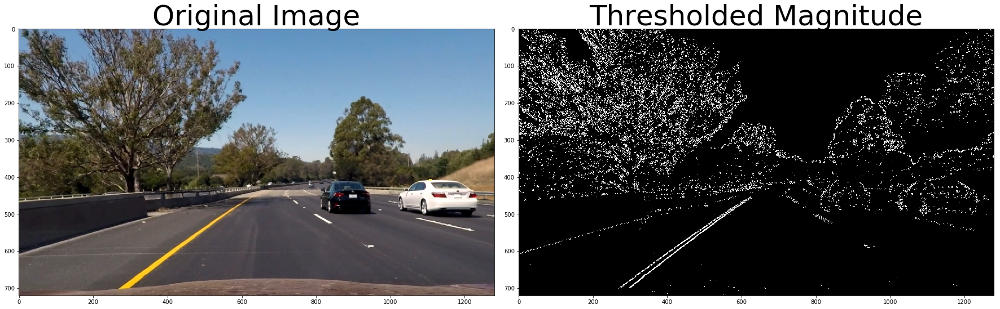

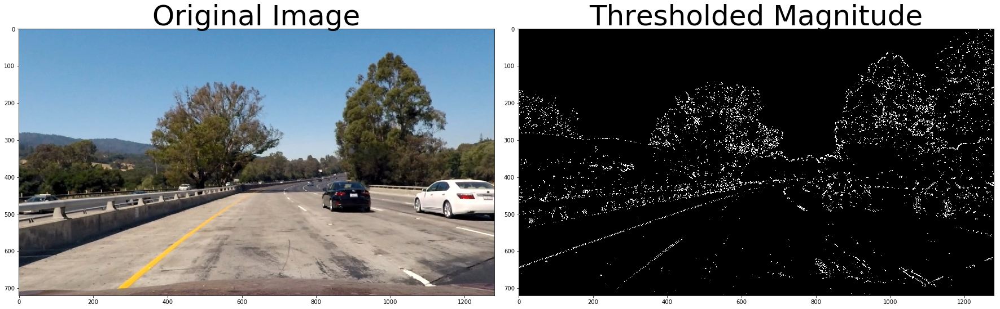

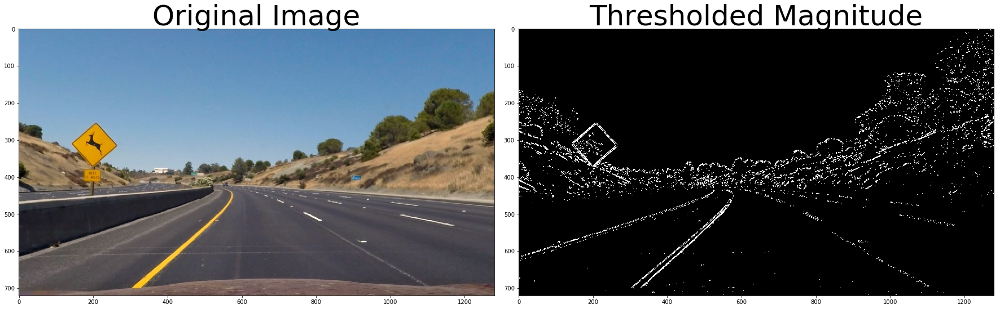

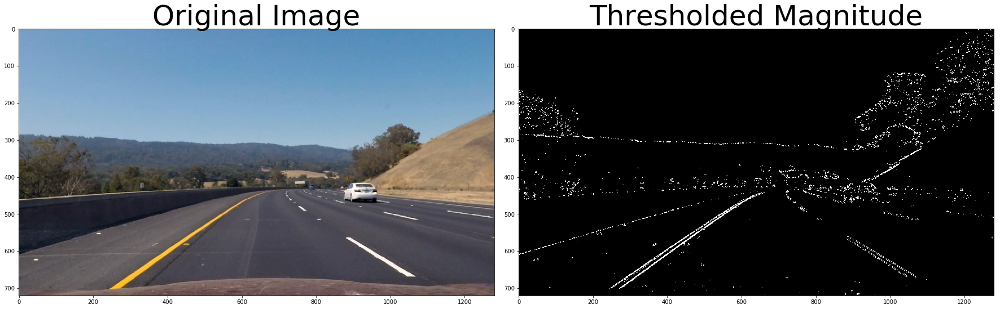

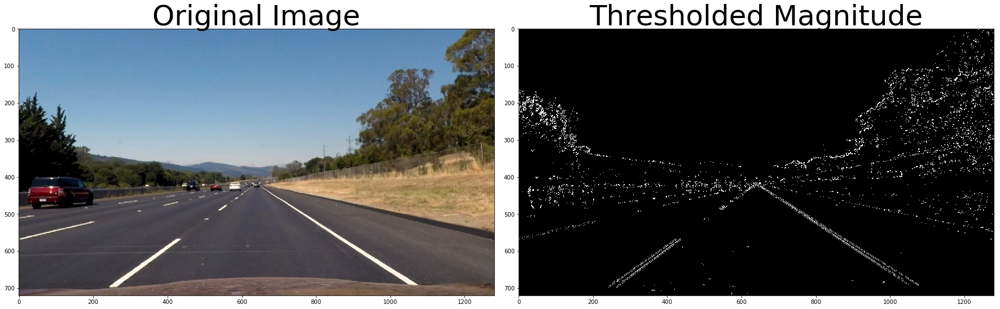

In [74]:

def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Calculate directional gradient
    # Apply threshold
    gray = []
    if (img.ndim == 3 and img.shape[2] == 3):
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    elif img.ndim == 2:
        gray = img.copy()
    else :
        print("Error note supported")
            
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return binary_output

def mag_thresh(image, sobel_kernel=3, mag_thresh=(0, 255)):
    # Calculate gradient magnitude
    # Apply threshold
    # Convert to grayscale
    gray = []
    if (img.ndim == 3 and img.shape[2] == 3):
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    elif img.ndim == 2:
        gray = img.copy()
    else :
        print("Error note supported")
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    return binary_output


def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Calculate gradient direction
    # Apply threshold
    # Grayscale
    gray = []
    if (img.ndim == 3 and img.shape[2] == 3):
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    elif img.ndim == 2:
        gray = img.copy()
    else :
        print("Error note supported")
        
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

def hls_select(s_channel, thresh=(0, 255)):
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

for image in imgs_test:
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]

    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    """ 
    dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.8, 1.3))
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(dir_binary, cmap='gray')
    ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()
    
    mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(30, 100))
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(mag_binary, cmap='gray')
    ax2.set_title('Thresholded Magnitude', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()
    """
    # Choose a Sobel kernel size
    ksize = 5 # Choose a larger odd number to smooth gradient measurements

    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(gray, orient='x', sobel_kernel=ksize, thresh=(20, 100))
    grady = abs_sobel_thresh(gray, orient='y', sobel_kernel=ksize, thresh=(20, 100))
    mag_binary = mag_thresh(gray, sobel_kernel=ksize, mag_thresh=(30, 100))
    dir_binary = dir_threshold(gray, sobel_kernel=ksize, thresh=(0.8, 1.3))
    
    hls_binary = hls_select(s_channel, thresh=(90, 255))
    
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1) & (hls_binary == 1))] = 1
    
    
    
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(combined, cmap='gray')
    ax2.set_title('Thresholded Magnitude', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()
    
    #break

Step 4: Apply a perspective transform to rectify binary image ("birds-eye view").

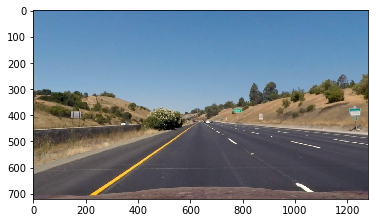

In [32]:
plt.imshow(imgs_test[0])

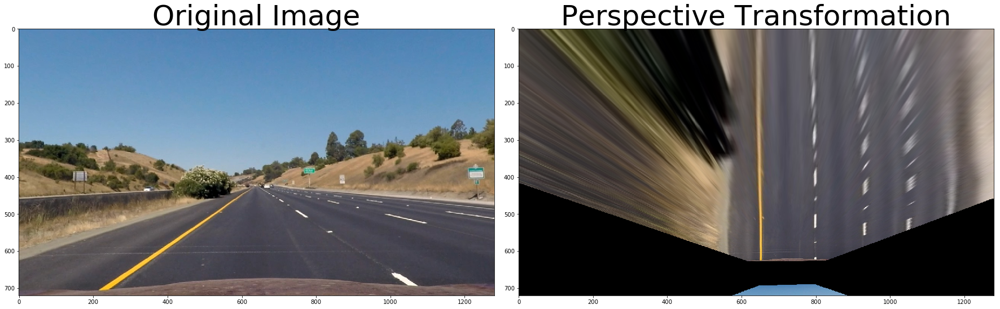

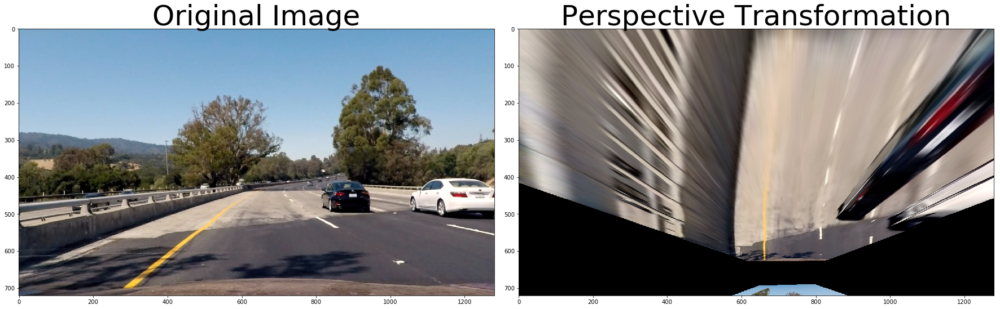

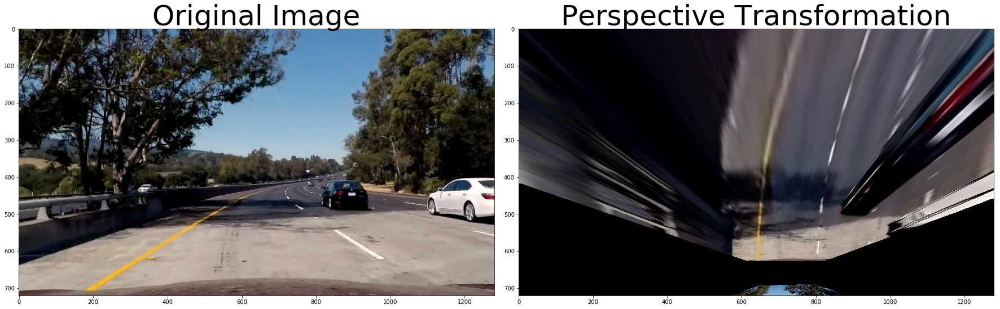

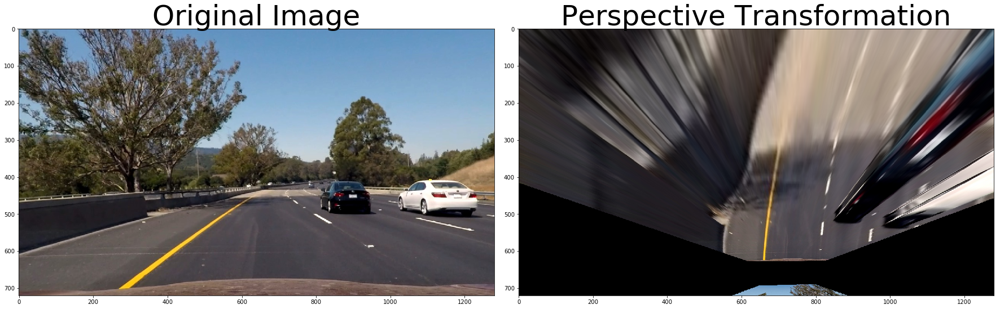

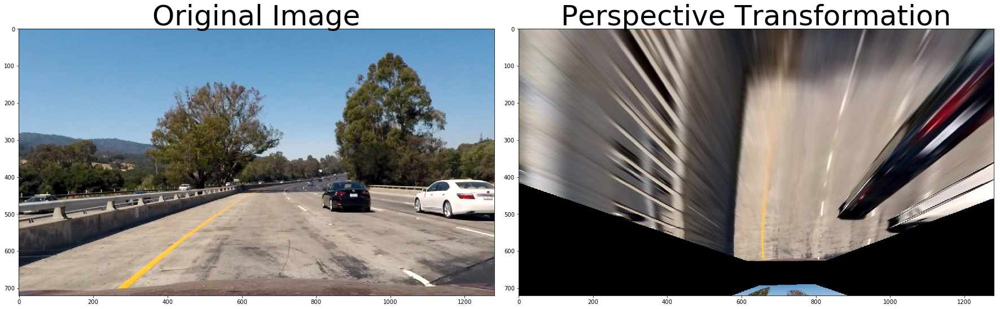

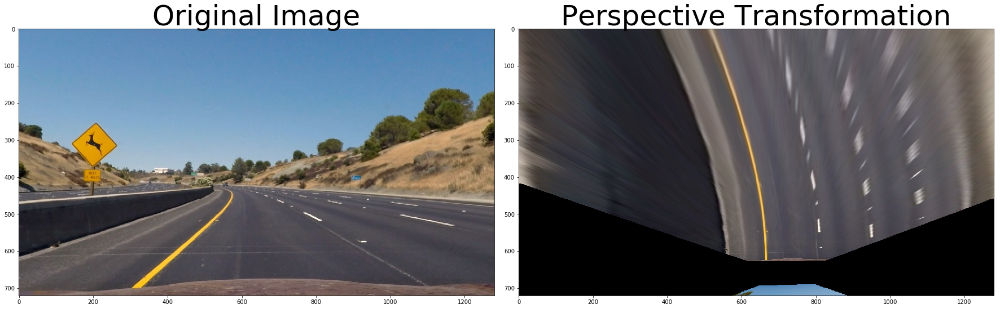

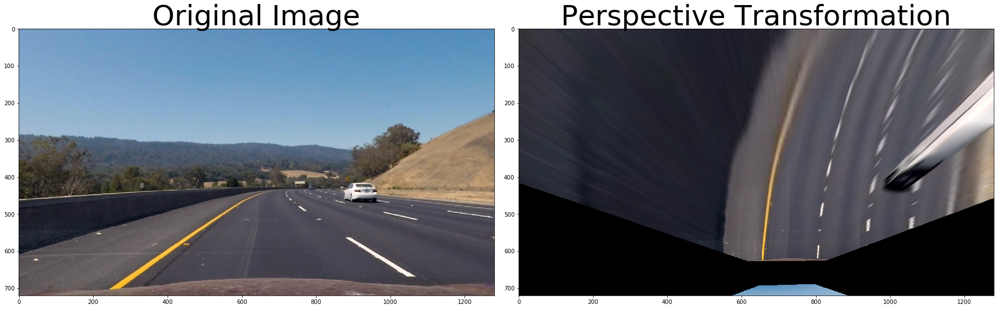

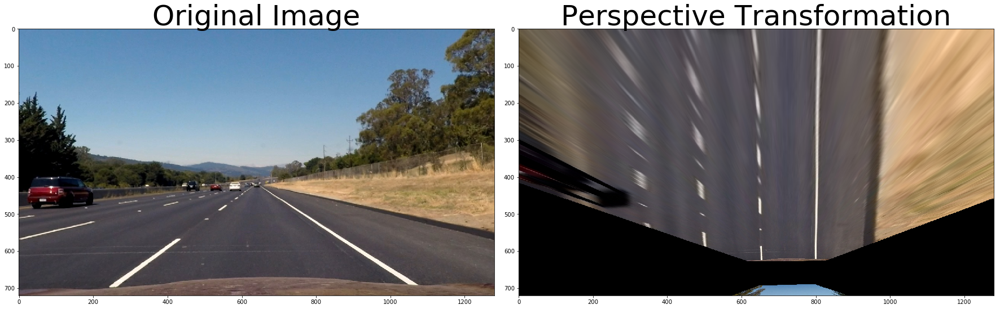

In [59]:
def warp_image(image):
    src = np.float32( 
        [[749,489],
        [921,597],
        [382,596],
        [539,490]] )
    dst = np.float32( 
        [[800,500,],    
        [800,600],
        [550,600],
        [550,500]] )
    img_size = (image.shape[1],image.shape[0])
    #M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(image, M , img_size, flags=cv2.INTER_LINEAR)
    return warped

for image in imgs_test:
    warped = warp_image(image)
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(warped)#, cmap='gray')
    ax2.set_title('Perspective Transformation', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()
    


Step 5: Detect lane pixels and fit to find the lane boundary.

Step 6: Determine the curvature of the lane and vehicle position with respect to center.

Step 7: Warp the detected lane boundaries back onto the original image.

Step 8: Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.